Text(0.5, 1.0, 'FFt with phi')

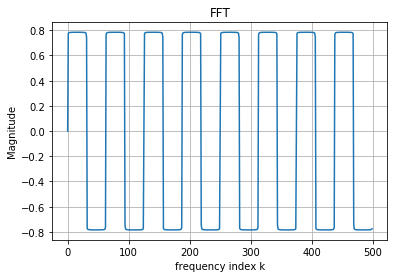

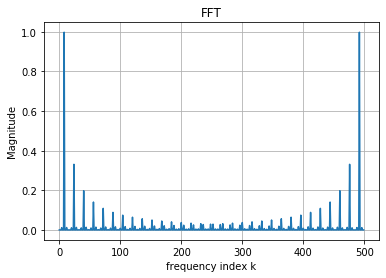

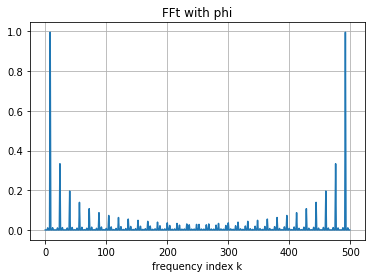

In [2]:
import numpy as np
>>> import matplotlib.pyplot as plt

y = [0]*500
x = np.arange(0,500)

def Bk(k):
    if (k % 2) == 0:
        return 0
    else:
        return 1.0/k
    
    
def ComponentfSeries(n):
    Fs = 8000
    t = n/Fs
    F = 128
    y = 0
    for k in range(500):
        y += Bk(k)* np.sin(2 * np.pi * k * F * t)
    return y


for n in range(500):
    y[n] = ComponentfSeries(n)
    
from scipy import fftpack

fig, ax0 = plt.subplots(1) 
ax0.plot(x, y)
ax0.set_xlabel("frequency index k") ; ax0.set_ylabel("Magnitude")
ax0.grid(True) ; ax0.set_title("FFT")  

S = fftpack.fft(y)
S = np.abs(S)
S = S/250.0

fig, ax0 = plt.subplots(1) 
ax0.plot(x, S)
ax0.set_xlabel("frequency index k") ; ax0.set_ylabel("Magnitude")
ax0.grid(True) ; ax0.set_title("FFT")  






y2 = [0]*500

def phik(k):
    if k == 3:
        return np.pi/2
    else:
        return 0

def ComponentfPhiSeries(n):
    Fs = 8000
    t = n/Fs
    F = 128
    y2 = 0
    for k in range(250):
        y2 += Bk(k)*np.sin((2*np.pi*k*F*t)+ phik(k))
    return y2


    

for n in range(500):
    x[n] = n
    y2[n] = ComponentfPhiSeries(n)
    
from scipy import fftpack

S2 = fftpack.fft(y2)
S2 = np.abs(S2)
S2 = S2/250.0



fig, ax1 = plt.subplots(1) 
ax1.plot(x, S2)
ax1.set_xlabel("frequency index k") ; ax0.set_ylabel("Magnitude")
ax1.grid(True) ; ax1.set_title("FFt with phi")  

    



    
        
    



#### 1. Comment on the waveform obtained for Fourier series (a) with about 4 or more non-zero
 harmonics. What would you expect the waveform to look like if you could take a very
 large number of harmonics?
#### 2. What features do you see in the FFT magnitude spectral graph for Fourier series (a)
Amplitude spectrum shows fundamental at k=0 and K = 500 & harmonics.

#### 3. How may the graph be improved?
I converted the horizontal axis to amplitude so they can directly be read of the graph

#### 4. In what ways are waveforms (a) and (b) similar and different?
They have the same frequency and wavelength of for the harmonics present however they have delays by -phi/F

#### 5. Why might waveforms (a) and (b) sound similar over an analog telephone line?
#### 6. The waveform in (a) may be considered to be a binary transmission (1 0 1 0 1 0 …) that
 might be sent over an analog telephone line. If this transmission were affected by phase
 distortion and produced waveform (b) at the receiver, why might this cause a problem? 

Unmodified Noisy Signal


Frequency Domain Processed Noisy Signal


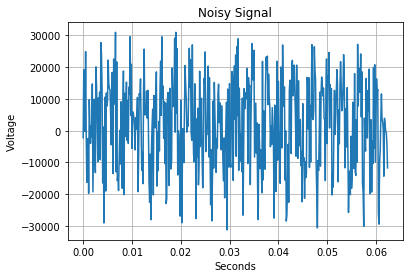

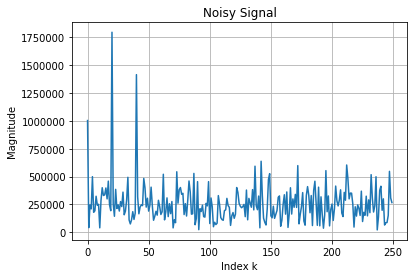

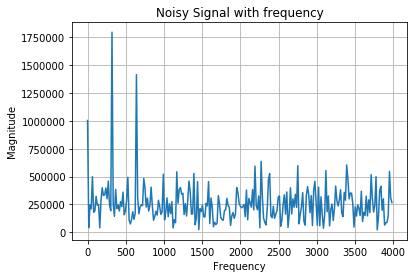

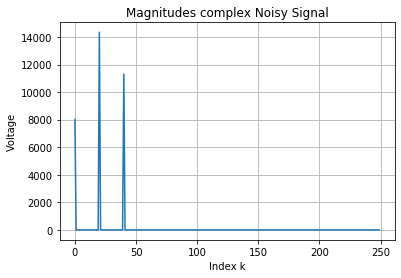

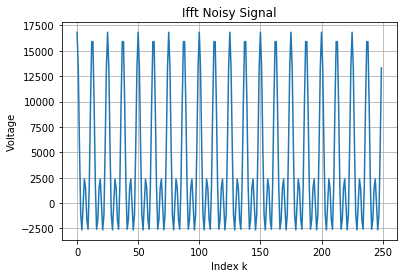

In [65]:
#2.2  Frequency-domain processing by FFT

from IPython import display as Dp
from scipy.io import wavfile
(Fs, NoisySig) = wavfile.read("noisySignal.wav")
print("Unmodified Noisy Signal")
Dp.display(Dp.Audio(NoisySig, rate=Fs))  

x = [0]*500 
for n in range(500):
    x[n] = n * (1/Fs)

fig, ax2 = plt.subplots(1) 
ax2.plot(x, NoisySig[:500])
ax2.set_xlabel("Seconds") ; ax2.set_ylabel("Voltage")
ax2.grid(True) ; ax2.set_title("Noisy Signal")  
###########





for n in range(500):
    x[n] = n
       
NoisySigF = NoisySig[:500]
NoisySigF = fftpack.fft(NoisySigF)
NoisySigF = np.abs(NoisySigF)




fig, ax3 = plt.subplots(1) 
ax3.plot(x[:250], NoisySigF[:250])
ax3.set_xlabel("Index k") ; ax3.set_ylabel("Magnitude")
ax3.grid(True) ; ax3.set_title("Noisy Signal")  


######### Modified Version with frequency

for n in range(500):
    x[n] = n * Fs/500
       

 
    
fig, ax3 = plt.subplots(1) 
ax3.plot(x[:250], NoisySigF[:250])
ax3.set_xlabel("Frequency") ; ax3.set_ylabel("Magnitude")
ax3.grid(True) ; ax3.set_title("Noisy Signal with frequency")  
    
######### F domain processing


real = NoisySigF.real
imag = NoisySigF.imag
imag.setflags(write=1)

#Symmetry
"""
for n in range (250):
    n = n+1
    real[250-n] = real[n]
    
"""



for n in range(250):
    if NoisySigF[n] < 700000:
        real[n] = 0
        imag[n] = 0
        
    else:
        real[n] = real[n]
        imag[n] = imag[n]
                      
MagnitudesComplex = np.sqrt(np.square(real) + np.square(imag))

x = np.arange(250)
fig, ax44 = plt.subplots(1) 
ax44.plot(x, MagnitudesComplex[:250]/125)
ax44.set_xlabel("Index k") ; ax44.set_ylabel("Voltage")
ax44.grid(True) ; ax44.set_title("Magnitudes complex Noisy Signal")  


InverseComplex = fftpack.ifft(MagnitudesComplex[:250])

x = np.arange(250)
fig, ax4 = plt.subplots(1) 
ax4.plot(x, InverseComplex[:250])
ax4.set_xlabel("Index k") ; ax4.set_ylabel("Voltage")
ax4.grid(True) ; ax4.set_title("Ifft Noisy Signal")  


print("Frequency Domain Processed Noisy Signal")
Dp.display(Dp.Audio(InverseComplex, rate=Fs))  








#### 1. Why do we only need to plot the first N/2 samples of the magnitude spectrum?

The DFT graph IS Symmetric about k=250 which corresponds to frequency Fs/2. Therefore to get to the maximum f you go up to f which is Fs/2 (Due to criterion)  and therefore the. Horiz axis goes from 0 to
250 for frequencies 0 to f kHz

#### 2. How is the periodic part of the sound and the noise seen in the magnitude spectrum?
They are presented harmonics of signal with peaks at each amplitude.

#### 3. What value of threshold was chosen and why? What would happen if it were (a) too high or (b) too low?
Threshold 700000. A TOO high would remove all the sound. Too low would not filter our other unwanted parts of the signal properly.

#### 4. Has any of the noise been removed by this ‘spectral subtraction’ process?

Yes so much that a tone can be heard quite clearly

#### 5. What Fourier series components are present in the periodic part of the sound?  What are their frequencies and relative amplitudes?

Two peaks/harmonics of est250 and 600Hz Their relative amplitudes range from 8000 to 14000

#### 6. Did you have any chance of answering question 5 by just observing the time-domain waveform (i.e. if you had never heard of the FFT)?

Not without software to view the plotted graph however the chance of spotting something periodic when such noise is avaialable is hard. It all depends on the Sig/Noise Ratio

Unmodified Noisy Signal


Audio after DCT


Threshold,  371.51927437641723
Audio after DCT and Magnitude processing


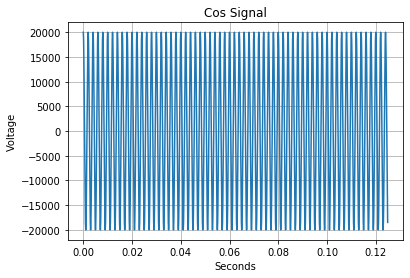

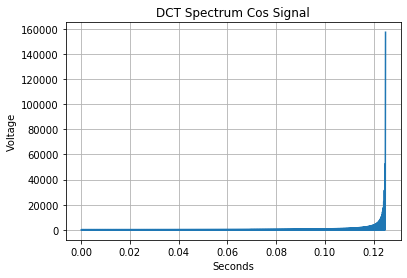

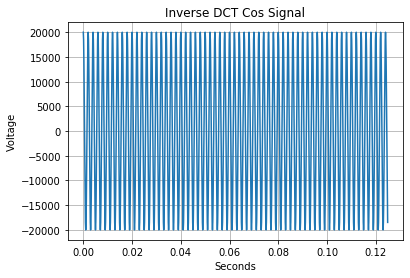

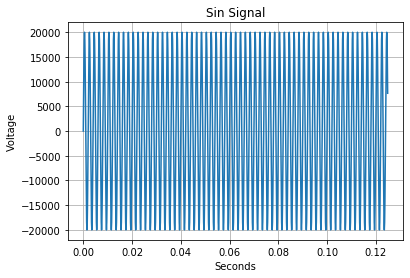

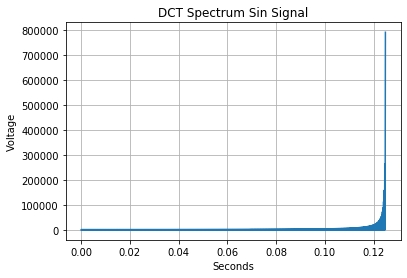

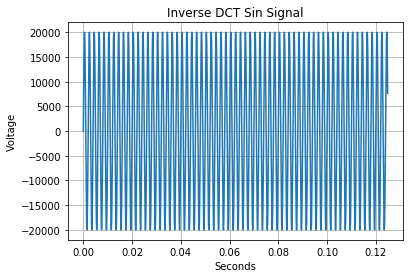

In [71]:
#EXP2.3

def coswaveGen(A, f, phi, D, Fs):
    NS = int(D * Fs)             # Number of samples required
    n = np.arange(0, NS)    # Makes n an array of integers 0, 1, 2, … NS-1
    y = A * np.cos( 2 * (np.pi) * f * n * T + phi)
    y = np.int16(y)  
    return y

Fs = 8000.0        
T = 1.0  / Fs      
A = 20000.0        
f = 500           
phi = 0.0           

x = [0]*1000
for n in range(1000):
    x[n] = n * 1/Fs
    
cosWave = coswaveGen(A, f, phi, 1, Fs)

fig, ax5 = plt.subplots(1) 
ax5.plot(x, cosWave[:1000])
ax5.set_xlabel("Seconds") ; ax5.set_ylabel("Voltage")
ax5.grid(True) ; ax5.set_title("Cos Signal") 

cosWaveDCT = fftpack.dct(cosWave, norm='ortho')
fig, ax6 = plt.subplots(1) 
ax6.plot(x, cosWaveDCT[:1000])
ax6.set_xlabel("Seconds") ; ax6.set_ylabel("Voltage")
ax6.grid(True) ; ax6.set_title("DCT Spectrum Cos Signal") 


cosWaveIDCT = fftpack.idct(cosWaveDCT, norm='ortho')
fig, ax7 = plt.subplots(1) 
ax7.plot(x, cosWaveIDCT[:1000])
ax7.set_xlabel("Seconds") ; ax7.set_ylabel("Voltage")
ax7.grid(True) ; ax7.set_title("Inverse DCT Cos Signal") 

### Sin


def sinwaveGen(A, f, phi, D, Fs):
    NS = int(D * Fs)             # Number of samples required
    n = np.arange(0, NS)    # Makes n an array of integers 0, 1, 2, … NS-1
    y = A * np.sin( 2 * (np.pi) * f * n * T + phi)
    y = np.int16(y)  
    return y

Fs = 8000.0        
T = 1.0  / Fs      
A = 20000.0        
f = 500           
phi = 0.0           

x = [0]*1000
for n in range(1000):
    x[n] = n * 1/Fs
    
sinWave = sinwaveGen(A, f, phi, 1, Fs)

fig, ax5 = plt.subplots(1) 
ax5.plot(x, sinWave[:1000])
ax5.set_xlabel("Seconds") ; ax5.set_ylabel("Voltage")
ax5.grid(True) ; ax5.set_title("Sin Signal") 

sinWaveDCT = fftpack.dct(sinWave, norm='ortho')
fig, ax6 = plt.subplots(1) 
ax6.plot(x, sinWaveDCT[:1000])
ax6.set_xlabel("Seconds") ; ax6.set_ylabel("Voltage")
ax6.grid(True) ; ax6.set_title("DCT Spectrum Sin Signal") 


sinWaveIDCT = fftpack.idct(sinWaveDCT, norm='ortho')
fig, ax7 = plt.subplots(1) 
ax7.plot(x, sinWaveIDCT[:1000])
ax7.set_xlabel("Seconds") ; ax7.set_ylabel("Voltage")
ax7.grid(True) ; ax7.set_title("Inverse DCT Sin Signal") 


### HQ MUSIC

from IPython import display as Dp
from scipy.io import wavfile
(Fs, HQmusic) = wavfile.read("HQ-music44100-mono.wav")
print("Unmodified Noisy Signal")
Dp.display(Dp.Audio(HQmusic, rate=Fs))  

HQ16 = np.int16(HQmusic)   # Convert to int16


DCTcoeffs = []
for n in range(861):
    dctF = [0]*1024
    for i in range(1023):
        dctF[i] = HQ16[(n*1024)+i]
    segmentDCT = fftpack.dct(dctF, norm='ortho')
    DCTcoeffs = np.concatenate((DCTcoeffs, segmentDCT))
    
DCTcoeffs = np.int16(DCTcoeffs)

# Read back from the large array

IDCTcoeffs = []
for n in range(861):
    ISegment = [0]*1024
    for i in range(1023):
        ISegment[i] = DCTcoeffs[(n*1024)+i]
    segmentIDCT = fftpack.idct(ISegment, norm='ortho')
    IDCTcoeffs = np.concatenate((IDCTcoeffs, segmentIDCT))
    
IDCTcoeffs = np.int16(IDCTcoeffs)
print("Audio after DCT")
Dp.display(Dp.Audio(IDCTcoeffs, rate=Fs))  



# PART 2 Doing it again but with frequency domain processing

(Fs, HQmusic) = wavfile.read("HQ-music44100-mono.wav")
HQ16 = np.int16(HQmusic)   # Convert to int16

threshold = 16000/44100*1024
#will be coded in layer
print("Threshold, ", threshold)

DCTcoeffs = []
for n in range(861):
    dctF = [0]*1024
    for i in range(1023):
        dctF[i] = HQ16[(n*1024)+i]
    segmentDCT = fftpack.dct(dctF, norm='ortho')
    ##### INSERT PROCESSING HERE for frequencies above 16k
    for i in range (740,1024):
        segmentDCT[i] = 0
    DCTcoeffs = np.concatenate((DCTcoeffs, segmentDCT))
    
DCTcoeffs = np.int16(DCTcoeffs)

# Read back from the large array

IDCTcoeffs = []
for n in range(861):
    ISegment = [0]*1024
    for i in range(1023):
        ISegment[i] = DCTcoeffs[(n*1024)+i]
    segmentIDCT = fftpack.idct(ISegment, norm='ortho')
    IDCTcoeffs = np.concatenate((IDCTcoeffs, segmentIDCT))
    
IDCTcoeffs = np.int16(IDCTcoeffs)
print("Audio after DCT and Magnitude processing")
Dp.display(Dp.Audio(IDCTcoeffs, rate=Fs))  






#### 1. Why does music have to be split up into sections when we wish to apply frequency-domain processing?

This is because signals are 'short-term stationary'. This simply means that we need the segments to be made short
enough, the contents may be considered approximately stationary and processed as though
the segment is exactly stationary so we can look at the component frequencies.
 
#### 2. Does the segmented DCT transformation, saving to an array, reading back and/or reconstruction introduce any noticeable distortion? Is there any change in loudness? If there is some distortion, what could be the cause of it?


There is some distortion this could be from gaps within the segments as it is presented as a constant quiet distorted signal/hum.


#### 3. What did you observe when analyzing the original music file using Audacity?

A wide range with a softly decreasing (but finish at 16,000Hz Spectrum).

#### 4. How did you process the DCT coefficients to remove all frequency components above16 kHz? What proportion of DCT coefficients were set to zero?

I found the index of K that correlated on the frequency domain to 16,000 and set all dct coeeficients above this level to 0. Roughly around 64% were set to zero

##### 5. Did you notice any change in the sound quality after the frequency-domain processing?.

When a sensible level of magnitudes are removed the sound is quieter. When removing the top end of the threshold the lower the threshold < 20khz the more muffled it siunds

##### 6. How was the spectrum affected as viewed using Audacity.

The higher frequencies had been ffiltered out from the signal above 16,000 Hz Aswell as some of the higher components (due to tbheir magnitude have b een filtered) This shows a smaller spectrum which decreases in volume (db) harsher than the original signal
.

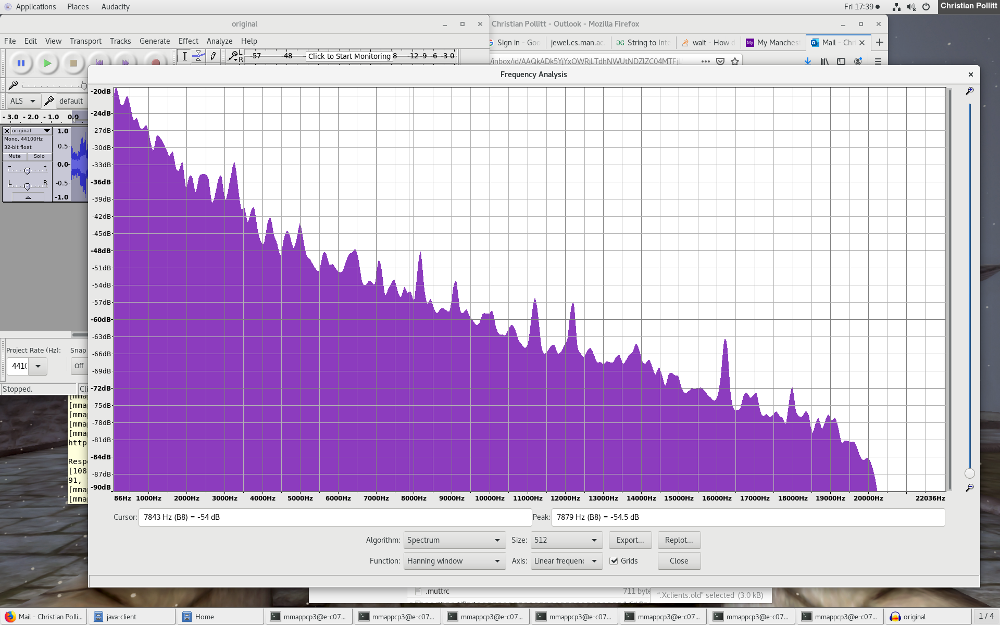

In [69]:
from IPython.display import Image
Image("ORIGINAL.png")

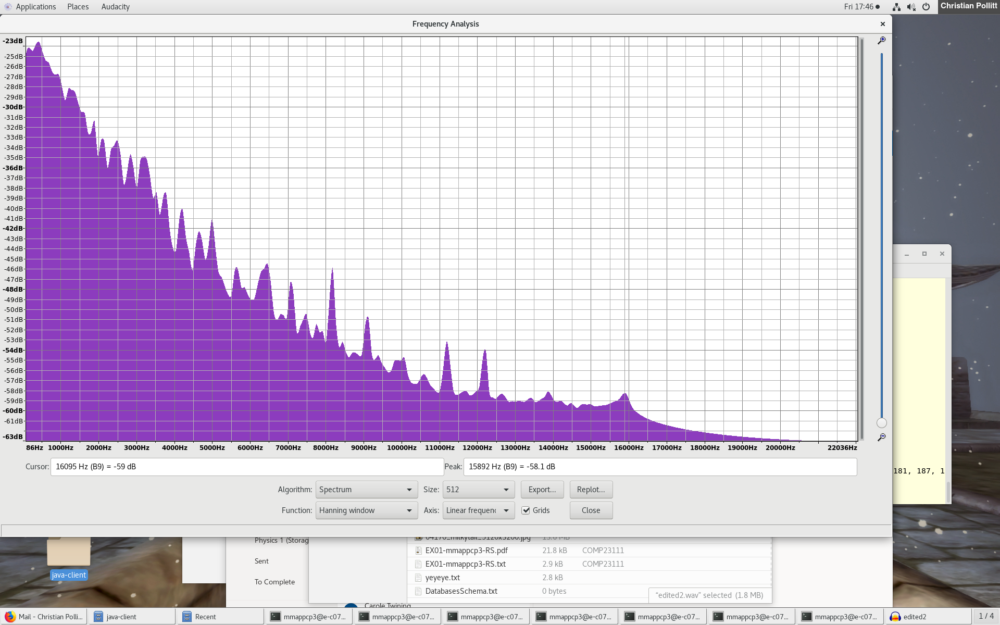

In [72]:
from IPython.display import Image
Image("FILTERED.png")

Unmodified Noisy Signal


NonZero Values 882001
Before Processing Bit count: 882001
Before Processing Bit Percentage: 100.0
Audio after Frequency masking RemovedSamples > 17000Hz


NonZero Values 265435
After Processing Bit count: 265435
After Processing Bit Percentage: 30.094637080910342
Processed Sound


Bits required with no processing =  14112016
Bits required with processing =  4246960
NonZero Values 94920
94920 Bits from the bitrate reduced to 8


Reccomended Bits required with processing = 8 


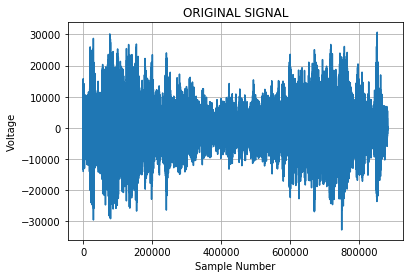

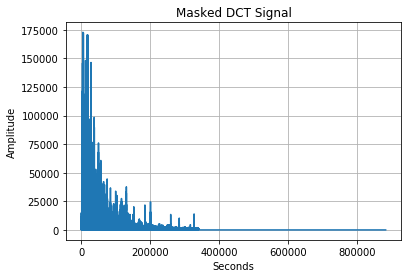

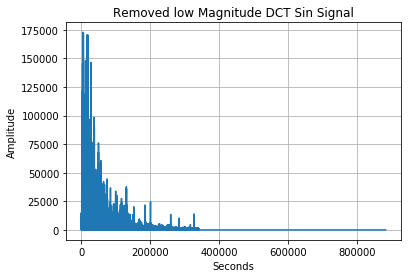

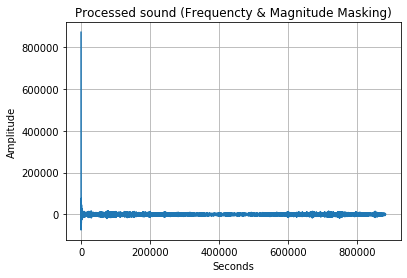

In [67]:
#EXP2.4
(Fs, Test) = wavfile.read("HQ-music44100-mono.wav")
print("Unmodified Noisy Signal")
Dp.display(Dp.Audio(Test, rate=Fs))  

x = np.arange(Test.size)
fig, ax7 = plt.subplots(1) 
ax7.plot(x, Test)
ax7.set_xlabel("Sample Number") ; ax7.set_ylabel("Voltage")
ax7.grid(True) ; ax7.set_title("ORIGINAL SIGNAL") 

def DCT(inputX):
    DCToutput = fftpack.dct(inputX, norm='ortho')
    return DCToutput

def IDCT(inputX):
    IDCToutput = fftpack.idct(inputX, norm='ortho')
    return IDCToutput
    
def maskDCT(DCTdata, thresholdF, Fs):
    DCTindex = thresholdF/Fs * DCTdata.size
    DCTindex = round(DCTindex)
    for i in range (DCTindex,DCTdata.size):
        DCTdata[i] = 0      
    return DCTdata  

def magnitudeMask(data, percentlevel):
    #DCT dosnt deal with complex numbers so this is straight forward
    percentlevel = percentlevel/100
    limit = np.amax(data) * percentlevel
    for n in range (data.size):
        if data[n] < limit:
            data[n] = 0
        else:
            data[n] = data[n]       
    return data
                  

    

    
#Removing Frequencies above 16,000 
Test = DCT(Test)



#Initial Bit Check
def nonZeroCount(data):
    NonZcount = 0
    for i in range(data.size):
        if data[i] != 0:
            NonZcount += 1
    print("NonZero Values", NonZcount)
    return NonZcount

count1 = nonZeroCount(Test)
print("Before Processing Bit count:", count1)

count1p = count1/Test.size * 100
print("Before Processing Bit Percentage:", count1p)




Test = maskDCT(Test, 17000, Fs) # Reduce number of bits total
FmaskTest = IDCT(Test)
print("Audio after Frequency masking RemovedSamples > 17000Hz")
Dp.display(Dp.Audio(FmaskTest, rate=Fs))




# THESE BITS ARE ONLY FOR PLOTTING
ABSTest = np.abs(Test)

x = np.arange(Test.size)
fig, ax7 = plt.subplots(1) 
ax7.plot(x, ABSTest)
ax7.set_xlabel("Seconds") ; ax7.set_ylabel("Amplitude")
ax7.grid(True) ; ax7.set_title("Masked DCT Signal") 

# Apply constant masking function
Test = magnitudeMask(Test, 0.2)
ABSTEST = magnitudeMask(ABSTest, 0.2)





count2 = nonZeroCount(ABSTest)
print("After Processing Bit count:", count2)

count2p = count2/Test.size * 100
print("After Processing Bit Percentage:", count2p)

fig, ax7 = plt.subplots(1) 
ax7.plot(x, ABSTest)
ax7.set_xlabel("Seconds") ; ax7.set_ylabel("Amplitude")
ax7.grid(True) ; ax7.set_title("Removed low Magnitude DCT Sin Signal")


ProcessedTest = IDCT(Test)
print("Processed Sound")
Dp.display(Dp.Audio(ProcessedTest, rate=Fs))

fig, ax7 = plt.subplots(1) 
ax7.plot(x, ProcessedTest)
ax7.set_xlabel("Seconds") ; ax7.set_ylabel("Amplitude")
ax7.grid(True) ; ax7.set_title("Processed sound (Frequencty & Magnitude Masking)")




        
# zeros (because of run-length encoding) assumed neglible i.e. zero. 

# Calculate how many bits would be required to represent the music with 16 bits per DCT coefficient and no frequency-domain processing.
print("Bits required with no processing = ", 16*count1)

# Calculate how many bits are required with the processing carried out so far with zero bits for each zero valued DCT coefficient and 16 bits for each non-zero value.
print("Bits required with processing = ", 16*count2)

# Experimenting with number of bits
def magnitudeMaskBits(data, percentlevel, bits):
    #DCT dosnt deal with complex numbers so this is straight forward
    percentlevel = percentlevel/100
    data = np.round(data*(2**(bits-1))-1) #Quantise to -15 to +15 as float
    limit = np.amax(data) * percentlevel
    for n in range (data.size):
        if data[n] < limit:
            data[n] = 0
        else:
            data[n] = data[n]     
    return data
    


(Fs, Test) = wavfile.read("HQ-music44100-mono.wav")
Test = DCT(Test)
Bit10Test = magnitudeMaskBits(Test, 0.5, 8)
countBits = nonZeroCount(Bit10Test)
print(countBits, "Bits from the bitrate reduced to 8")
ProcessedTest10Bits = IDCT(Bit10Test)


Dp.display(Dp.Audio(ProcessedTest10Bits, rate=Fs))
print("Reccomended Bits required with processing = 8 ")



    



#### 1. What is the effect of varying the constant threshold? What happens with a value that (a) is definitely too high, (b) too low and (c) potentially satisfactory? Give the values.

The sound is made quieter with a lower threshold, high end sound becomes unintellgibale and eventually silent. Too high dosnt add any processing and therefore bits are not reduced. I found that filtering a value of about 2% of the below maximum amplitude gave satisafactory results.

#### 2. Is there any advantage to having a threshold that varies from section to section according to the loudness?
Perhaps However this was not implemented as was an option. It would work for videos better however popular music is generally mixed and mastered with constant levels.

#### 3. For the potentially satisfactory threshold or thresholds, what percentage bit-rate saving is achieved with zero and 16 bits assumed to be required for zero and non-zero DCT coefficients respectively.
The Difference is 14112016 - 4246960 = 13687326 is the bit saving.


#### 4. What was the minimum number of bits per non-zero DCT coefficient that gave acceptable sound quality with the threshold or thresholds found to be potentially satisfactory?

8 Bits per non-zero coefficient provided satisfactory results with no evidence of quantisation results.

#### 5. What bit-rate saving (in percentage terms) is achieved with the number of bits per nonzero DCT coefficient given in your answer to question 4?
4246960 -> 94920 Bits
Therefore a 77% Bit saving



#### 6. Did you observe any distortion due to discontinuities at frame boundaries? If so, what causes this distortion and what techniques are available for reducing it ? 

The distortions are quantisation noise By using non-uniform quantisation you can reduce an equal or sometimes better bit rate by reducing bits where they dont matter as much within a signal. The theory is used within LPCM which is where quantization levels vary as a function of amplitude.

In [80]:
#EX2.5

string = "01100006600999900"
def encode(string):
    result = ''
    previous = ''
    counter = 0
    for i in range(1,len(string),1):
        if i == 1: # if the first one is zero
            if string[0] == str(0):
                counter += 1
                if string[i+1] != 0:
                    result += str(0)
                    result += str(counter)
                                  
        if i == (len(string)-1): # for last zero
            if string[i] == str(0):
                counter += 1
                result += str(0)
                result += str(counter)
        
                    
        if string[i] == str(0): # for any other zeros
            counter += 1
        else:
            if previous == str(0):
                result += str(0)
                result += str(counter)
                counter = 0
            result += string[i]  
            
        previous = string[i]
    return result

# encode(string)








# ACTUAL EXAMPLE

def encodingProper(array):
    result = []
    previous = -1
    counter = 1
    
    for i in range(1 ,array.size, 1):
        
        if i == 0: # FOR THE FIRST VALUE ARRAY IF THE FIRST IS O
            if array[i] == 0: # COUNT THE FIRST 0
                counter += 1
            if array[i+1] != 0: # IF THE NEXT ISNT ZERO THEN
                result.append(0)
                result[i+1] = counter # if next isnt zero close up count
                counter = 0 #reset counter
                print("should do 01")
                    
            else:
                print("SHOULDNT PRINT")
                
        if i == (array.size-1): # for last zero
            if array[i] == 0:
                counter += 1
                result.append(0)
                result.append(counter)
                counter = 0
            else:
                result.append(array[i])
        else: # IF NOT THE FIRST VALUE OF ARRAY
            if array[i] == 0: # IF A ZERO FOUND AGAIN
                counter += 1
                previous = array[i]
            else:             # IF NOT ZERO THEN CLOSE UP
                if previous == 0: # if previous and now not then close up count and add new value
                    result.append(0)
                    result.append(counter)
                    counter = 0 #reset counter
                    previous = array[i]
                    result.append(array[i])
                else:
                    result.append(array[i])
                    previous = array[i]

            
        
    return result





(Fs, HQmusic) = wavfile.read("HQ-music44100-mono.wav")
HQ16 = np.int16(HQmusic)   # Convert to int16
DCTcoeffs = []

for n in range(1):
    dctF = [0]*1024
    for i in range(1024):
        dctF[i] = HQ16[(n*1024)+i]
    segmentDCT = fftpack.dct(dctF, norm='ortho')
    
    segmentDCT[0] = 0
    segmentDCT[1] = 0
    segmentDCT[5:8] = 0
    segmentDCT[9] = 0
    print("Run Length over a short 10 Space period")
    print(segmentDCT[:10])
    print(encodingProper(segmentDCT[:10]))
    
    
def nonZeroCount(data):
    NonZcount = 1
    for i in range(data.size):
        if data[i] != 0:
            NonZcount += 1
    return NonZcount   
    
    
    
# FOR 1024 SAMPLES

(Fs, HQmusic) = wavfile.read("HQ-music44100-mono.wav")
HQ16 = np.int16(HQmusic)   # Convert to int16
DCTcoeffs = []



for n in range(1):
    dctF = [0]*1024
    for i in range(1024):
        dctF[i] = HQ16[(n*1024)+i]
    segmentDCT = fftpack.dct(dctF, norm='ortho')
    
    print("OVER 1024 COEFFICIENTS ----------")
    print(segmentDCT)
    y1024 = encodingProper(segmentDCT)
    y1024 = np.asarray(y1024)
    count1 = nonZeroCount(y1024)
    initialP = count1/1024 * 100
    print("-----------")
    print("Number of bits for DCT segment 1024:", count1)
    y1024 = magnitudeMask(y1024, 0.1)
    count2 = nonZeroCount(y1024)
    finalP = count2/1024 * 100
    print("Number of Non-zero Bit count for PROCESSED (non-zero) 1024:", count2)
    print("Bit Saving", initialP, "Down to", finalP)
    
    encoded1024 = encodingProper(y1024)
    encoded1024 = np.asarray(encoded1024)
    encodedSize = encoded1024.size
    print("-----------")
    print("Number of Bits for encoded segment:", encodedSize)
    print("Bit saving % an extra from processing reducing = ", encodedSize/count1 * 100)
    
    
    
#FOR all DCT COEFFICIENTS

TotalBits = 0
TotalBitsProcessed = 0
TotalBitsProcessedEncoded = 0

for n in range(861):
    dctF = [0]*1024
    for i in range(1024):
        dctF[i] = HQ16[(n*1024)+i]
    segmentDCT = fftpack.dct(dctF, norm='ortho')
    

    y1024 = encodingProper(segmentDCT)
    y1024 = np.asarray(y1024)
    count1 = nonZeroCount(y1024)
    initialP = count1/1024 * 100
    
    TotalBits += count1 
    y1024 = magnitudeMask(y1024, 0.1)
    TotalBitsProcessed +=  y1024.size

    encoded1024 = encodingProper(y1024)
    encoded1024 = np.asarray(encoded1024)
    encodedSize = encoded1024.size
    TotalBitsProcessedEncoded += encodedSize # All bits even 0 are important in run length (REQUIRE BITS to store unlike before) 
    
    
print("OVER ALL COEFFICIENTS -----------")
print("Total Bits without any processing:", TotalBits)
print("Total Bits with processing & encoding:", TotalBitsProcessedEncoded)
print("Percentage Bit Saving", TotalBitsProcessedEncoded/TotalBits * 100)

 


def Decoder(data):
    for x in range(data.size):
        result = [0] * data.size
        if data[x] == 0:
            value = data[x+1]
            limit = int(round(value))
            print(limit)
            count = 0
            for n in range(limit):
                result[x+n] = 0
                count += 1
        else:
            result[x] = data[x]
    return result

print(Decoder(encoded1024))
                
            
    
    



 


    




Run Length over a short 10 Space period
[      0.               0.           29517.56077691   51239.39689227
  -13334.51070664       0.               0.               0.
 -103243.66614751       0.        ]
[0, 2, 29517.56077691254, 51239.396892270706, -13334.510706636638, 0, 3, -103243.66614751442, 0, 1]
OVER 1024 COEFFICIENTS ----------
[ 1.92985000e+04  3.02528105e+04  2.95175608e+04 ... -5.84976378e+00
 -4.70391184e+00 -3.38639698e+00]
-----------
Number of bits for DCT segment 1024: 1024
Number of Non-zero Bit count for PROCESSED (non-zero) 1024: 191
Bit Saving 100.0 Down to 18.65234375
-----------
Number of Bits for encoded segment: 403
Bit saving % an extra from processing reducing =  39.35546875
OVER ALL COEFFICIENTS -----------
Total Bits without any processing: 881664
Total Bits with processing & encoding: 478867
Percentage Bit Saving 54.31400170586528
3
4
3
6
4
2
3
10
1
4
1
2
3
1
2
2
1
4
1
2
5
1
3
2
1
6
7
1
2
1
2
2
4
4
1
3
2
1
1
4
2
4
1
1
2
9
1
7
1
1
6
1
1
4
1
2
1
1
3
5
2
4
2

##### 1: Describe your run-length coding scheme and demonstrate it for an example frame
There is a demonstration the code the first zero is its own case checks if the next value (as no previous stored)
Otherwise everytime it approaches a non-zero if the previous was a non-zero it adds the encoding {0, count} to the last digit is also handled differently if it is zero then it will add the encoding as the next coeff dosnt exist trigger the encoding after 0's finish


#### 2. Describe and demonstrate the decoding algorithm for your example frame.




#### 3. What bit-rate saving was achieved for your demonstration?

40% less bits for Encoding after processing
54% less bits as a combination of encoding and Processing from the original signal.


#### 4. Will your scheme work for all possible sequences?

Yes (zero ends and start)


#### 5. What bit-rate saving (in percentage terms) was achieved by your run-length coding scheme applied to the processed DCT coefficients obtained for music in Expt 2.4?

40%


#### 6. What bit-rate saving was achieved by the processing in Expt 2.4 combined with your run- length coding scheme. Does your scheme add any distortion to the music?

54%